In [76]:
import scipy
import json
import os
import numpy as np

import pandas as pd
import seaborn as sns
import scipy.stats
import statsmodels.api as sm

import matplotlib.pyplot as plt

from scipy.signal import correlate

In [12]:
def load_single_contribution_attack_results(
    scenario: str,
    version: str,
    dataset: str
):
    '''Loads json file (attack results) and csv files (Shapley, LOO)
    into a one pandas dataframe'''
    
    ## Loads the json file with atack metrics
    metrics = ['TPR', 'AUC']
    json_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'nodes_attack_results.json')
    shapley_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'results', 'partial_shapley.csv')
    loo_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'results', 'partial_loo.csv')
    with open(json_path, 'r+') as file:
        json_file = json.load(file)
    clients_ids = [int(i) for i in json_file.keys() if i != 'average']
    iterations = [int(i) for i in json_file['0'].keys()]
    iterations.sort()
    headings = [f'{client}_{metric}' for client in clients_ids for metric in metrics]
    
    dataframe = pd.DataFrame(index=iterations, columns=headings)
    
    # Loads attack results into the frame
    for client in clients_ids:
        for iteration in iterations:
            client_data = json_file[str(client)][str(iteration)]['average']
            for heading in metrics:
                dataframe.loc[iteration, f"{client}_{heading}"] = client_data[heading]
    
    # Loads shapley into the frame
    shapley_frame = pd.read_csv(shapley_path)
    loo_frame = pd.read_csv(loo_path)
    for client in clients_ids:
        # Loads shapley values
        array = shapley_frame[shapley_frame['node_id'] == client]['accuracy'].reset_index(drop=True)
        dataframe[f'{client}_SHAP_ACC'] = array
        array = shapley_frame[shapley_frame['node_id'] == client]['f1score'].reset_index(drop=True)
        dataframe[f'{client}_SHAP_F1SCORE'] = array
        
        # Loads LOO values
        array = loo_frame[shapley_frame['node_id'] == client]['accuracy'].reset_index(drop=True)
        dataframe[f'{client}_LOO_ACC'] = array
        array = loo_frame[shapley_frame['node_id'] == client]['f1score'].reset_index(drop=True)
        dataframe[f'{client}_LOO_F1SCORE'] = array
    
    return dataframe

In [13]:
def load_single_contribution_attack_results(
    scenario: str,
    version: str,
    dataset: str
):
    '''Loads json file (attack results) and csv files (Shapley, LOO)
    into a one pandas dataframe'''
    
    ## Loads the json file with atack metrics
    metrics = ['TPR', 'AUC']
    json_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'nodes_attack_results.json')
    shapley_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'results', 'partial_shapley.csv')
    loo_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'results', 'partial_loo.csv')
    with open(json_path, 'r+') as file:
        json_file = json.load(file)
    clients_ids = [int(i) for i in json_file.keys() if i != 'average']
    iterations = [int(i) for i in json_file['0'].keys()]
    iterations.sort()
    headings = [f'{client}_{metric}' for client in clients_ids for metric in metrics]
    
    dataframe = pd.DataFrame(index=iterations, columns=headings)
    
    # Loads attack results into the frame
    for client in clients_ids:
        for iteration in iterations:
            client_data = json_file[str(client)][str(iteration)]['average']
            for heading in metrics:
                dataframe.loc[iteration, f"{client}_{heading}"] = client_data[heading]
    
    # Loads shapley into the frame
    shapley_frame = pd.read_csv(shapley_path)
    loo_frame = pd.read_csv(loo_path)
    for client in clients_ids:
        # Loads shapley values
        array = shapley_frame[shapley_frame['node_id'] == client]['accuracy'].reset_index(drop=True)
        dataframe[f'{client}_SHAP_ACC'] = array
        array = shapley_frame[shapley_frame['node_id'] == client]['f1score'].reset_index(drop=True)
        dataframe[f'{client}_SHAP_F1SCORE'] = array
        
        # Loads LOO values
        array = loo_frame[shapley_frame['node_id'] == client]['accuracy'].reset_index(drop=True)
        dataframe[f'{client}_LOO_ACC'] = array
        array = loo_frame[shapley_frame['node_id'] == client]['f1score'].reset_index(drop=True)
        dataframe[f'{client}_LOO_F1SCORE'] = array
    
    return dataframe

In [14]:
def load_multiple_contribution_attack_results(
    scenarios: list[str],
    versions: list[str],
    datasets: list[str]
):
    all_results = {
        f"{scenario}_{version}_{dataset}" : None
        for scenario in scenarios
        for version in versions
        for dataset in datasets
    }
    for scenario in scenarios:
        for version in versions:
            for dataset in datasets:
                key = f"{scenario}_{version}_{dataset}"
                all_results[key] = load_single_contribution_attack_results(
                    scenario=scenario,
                    version=version,
                    dataset=dataset
                    )
    return all_results

In [55]:
def calculate_single_corr(
    no_clients: int,
    frame: pd.DataFrame,
    mode: 'str'
):
    if mode == 'spearman':
        correlation = scipy.stats.spearmanr
    elif mode =='pearson':
        correlation = scipy.stats.pearsonr
    else:
        assert NameError
    corr_frame = pd.DataFrame(index=range(no_clients))
    
    for client in range(no_clients):
        corr_frame.loc[client, 'TPR_TO_SHAP_ACC'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_ACC']
        ).statistic
        corr_frame.loc[client, 'AUC_TO_SHAP_ACC'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_SHAP_ACC']
        ).statistic
        corr_frame.loc[client, 'TPR_TO_SHAP_F1SCORE'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_F1SCORE']
        ).statistic
        corr_frame.loc[client, 'AUC_TO_SHAP_F1SCORE'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_SHAP_F1SCORE']
        ).statistic
        
        corr_frame.loc[client, 'TPR_TO_LOO_ACC'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_LOO_ACC']
        ).statistic
        corr_frame.loc[client, 'AUC_TO_LOO_ACC'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_LOO_ACC']
        ).statistic
        corr_frame.loc[client, 'TPR_TO_LOO_F1SCORE'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_LOO_F1SCORE']
        ).statistic
        corr_frame.loc[client, 'AUC_TO_LOO_F1SCORE'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_LOO_F1SCORE']
        ).statistic
    return corr_frame

In [63]:
def calculate_single_stationarity(
    no_clients: int,
    frame: pd.DataFrame,
):
    statio_frame = pd.DataFrame(index=range(no_clients))
    
    for client in range(no_clients):
        tpr_results = sm.tsa.stattools.adfuller(frame[f'{client}_TPR'])
        shap_results = sm.tsa.stattools.adfuller(frame[f'{client}_SHAP_F1SCORE'])
        
        statio_frame.loc[client, 'TPR ADF Statistic'] = tpr_results[0]
        statio_frame.loc[client, 'TPR ADF p-value'] = tpr_results[1]
        statio_frame.loc[client, 'SHAP ADF Statistic'] = shap_results[0]
        statio_frame.loc[client, 'SHAP ADF p-value'] = shap_results[1]

    return statio_frame

In [16]:
def calculate_single_corr_short(
    no_clients: int,
    frame: pd.DataFrame,
    mode: 'str'
):
    if mode == 'spearman':
        correlation = scipy.stats.spearmanr
    elif mode =='pearson':
        correlation = scipy.stats.pearsonr
    else:
        assert NameError
    corr_frame = pd.DataFrame(index=range(no_clients))
    
    for client in range(no_clients):
        corr = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_ACC']
        )
        corr_frame.loc[client, 'TPR_TO_SHAP_ACC CORR'] = corr.statistic
        corr_frame.loc[client, 'TPR_TO_SHAP_ACC P-VALUE'] = corr.pvalue
        
        corr = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_F1SCORE']
        )
        
        corr_frame.loc[client, 'TPR_TO_SHAP_F1SCORE'] = corr.statistic
        corr_frame.loc[client, 'TPR_TO_SHAP_F1SCORE P-VALUE'] = corr.pvalue
        
    return corr_frame

In [69]:
def calculate_multiple_stationarity(
    results : dict,
    no_clients : int,
):
    all_results = {key:None for key in results.keys()}
    for key, frame in results.items():
        all_results[key] = calculate_single_stationarity(frame=frame, no_clients=no_clients)
    return all_results

In [18]:
def calculate_multiple_corr(
    results : dict,
    no_clients : int,
    mode : str
):
    all_results = {key:None for key in results.keys()}
    for key, frame in results.items():
        all_results[key] = calculate_single_corr(frame=frame, no_clients=no_clients, mode=mode)
    return all_results

In [ ]:
def calculate_multiple_stat(
    results : dict,
    no_clients : int,
    mode : str
):
    all_results = {key:None for key in results.keys()}
    for key, frame in results.items():
        all_results[key] = calculate_single_corr(frame=frame, no_clients=no_clients, mode=mode)
    return all_results

In [19]:
def calculate_single_pvalue(
    no_clients: int,
    frame: pd.DataFrame,
    mode: 'str'
):
    if mode == 'spearman':
        correlation = scipy.stats.spearmanr
    elif mode =='pearson':
        correlation = scipy.stats.pearsonr
    else:
        assert NameError
    corr_frame = pd.DataFrame(index=range(no_clients))
    
    for client in range(no_clients):
        corr_frame.loc[client, 'TPR_TO_SHAP_ACC'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_ACC']
        ).pvalue
        corr_frame.loc[client, 'AUC_TO_SHAP_ACC'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_SHAP_ACC']
        ).pvalue
        corr_frame.loc[client, 'TPR_TO_SHAP_F1SCORE'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_F1SCORE']
        ).pvalue
        corr_frame.loc[client, 'AUC_TO_SHAP_F1SCORE'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_SHAP_F1SCORE']
        ).pvalue
        
        corr_frame.loc[client, 'TPR_TO_LOO_ACC'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_LOO_ACC']
        ).pvalue
        corr_frame.loc[client, 'AUC_TO_LOO_ACC'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_LOO_ACC']
        ).pvalue
        corr_frame.loc[client, 'TPR_TO_LOO_F1SCORE'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_LOO_F1SCORE']
        ).pvalue
        corr_frame.loc[client, 'AUC_TO_LOO_F1SCORE'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_LOO_F1SCORE']
        ).pvalue
    return corr_frame

In [20]:
def calculate_multiple_pvalues(
    results : dict,
    no_clients : int,
    mode : str
):
    all_results = {key:None for key in results.keys()}
    for key, frame in results.items():
        all_results[key] = calculate_single_pvalue(frame=frame, no_clients=no_clients, mode=mode)
    return all_results

In [ ]:
def check_multiple_stationarity(
    results: dict
):
    stationarity_frame = pd.DataFrame(index=results.keys(), columns=['TPR ADF Statistic', 'TPR p-Value', 'Shap ADF Statistic', 'SHAP p-value'])
    for key, value in stationarity_frame.items():
        

# Stage I: Visualization of timeline progression

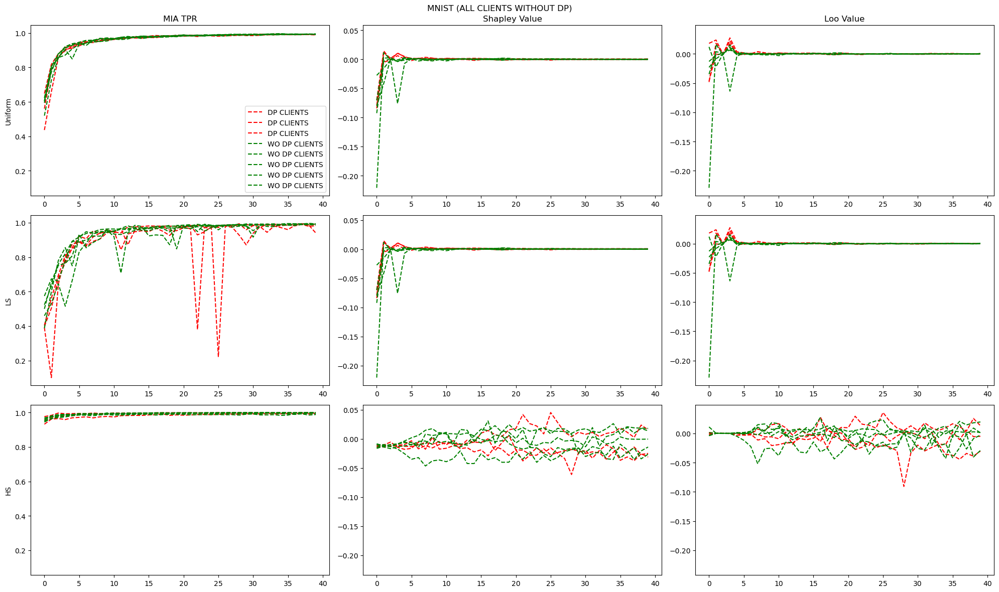

In [21]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

axes[1][0].sharey(axes[0][0])
axes[2][0].sharey(axes[0][0])
axes[1][1].sharey(axes[0][1])
axes[2][1].sharey(axes[0][1])
axes[1][2].sharey(axes[0][2])
axes[2][2].sharey(axes[0][2])


fig.suptitle("MNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

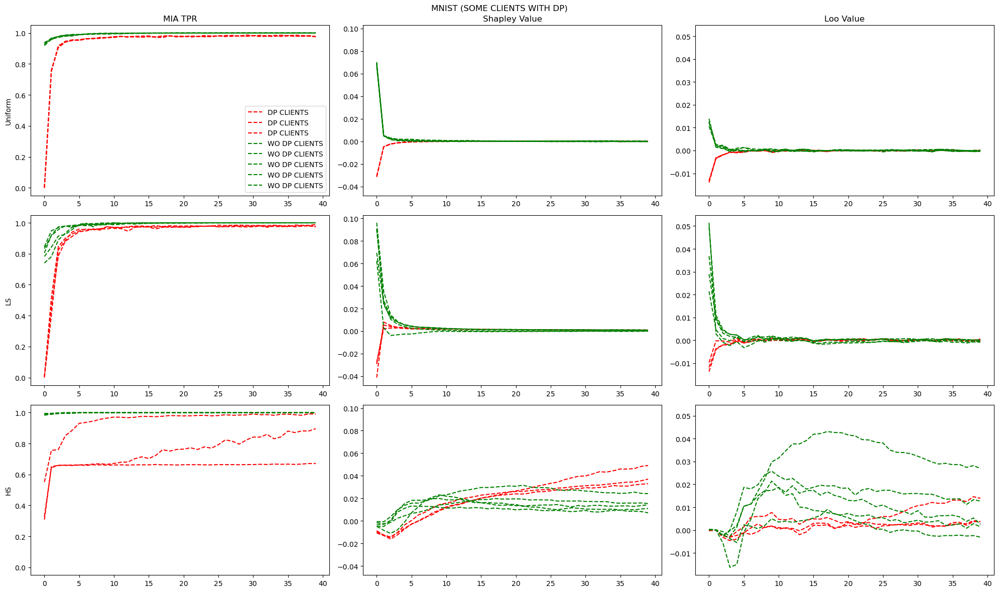

In [22]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

axes[1][0].sharey(axes[0][0])
axes[2][0].sharey(axes[0][0])
axes[1][1].sharey(axes[0][1])
axes[2][1].sharey(axes[0][1])
axes[1][2].sharey(axes[0][2])
axes[2][2].sharey(axes[0][2])

fig.suptitle("MNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

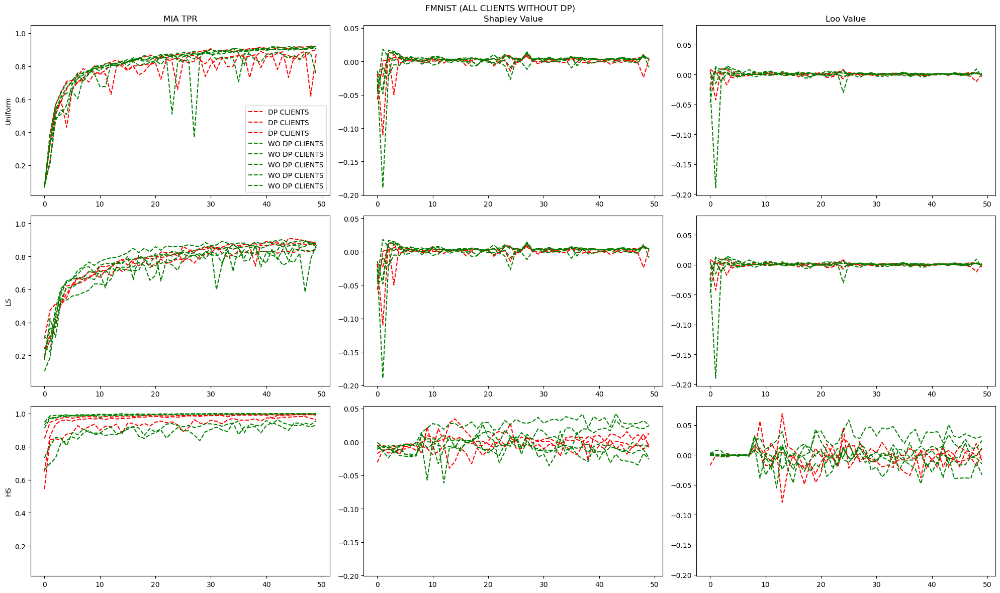

In [23]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

axes[1][0].sharey(axes[0][0])
axes[2][0].sharey(axes[0][0])
axes[1][1].sharey(axes[0][1])
axes[2][1].sharey(axes[0][1])
axes[1][2].sharey(axes[0][2])
axes[2][2].sharey(axes[0][2])

fig.suptitle("FMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

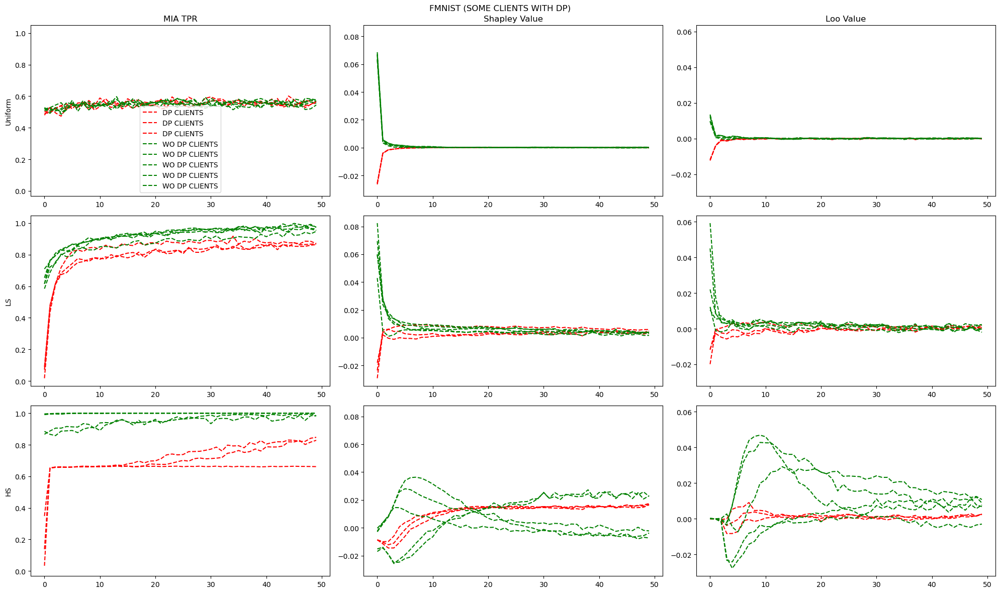

In [24]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

axes[1][0].sharey(axes[0][0])
axes[2][0].sharey(axes[0][0])
axes[1][1].sharey(axes[0][1])
axes[2][1].sharey(axes[0][1])
axes[1][2].sharey(axes[0][2])
axes[2][2].sharey(axes[0][2])

fig.suptitle("FMNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

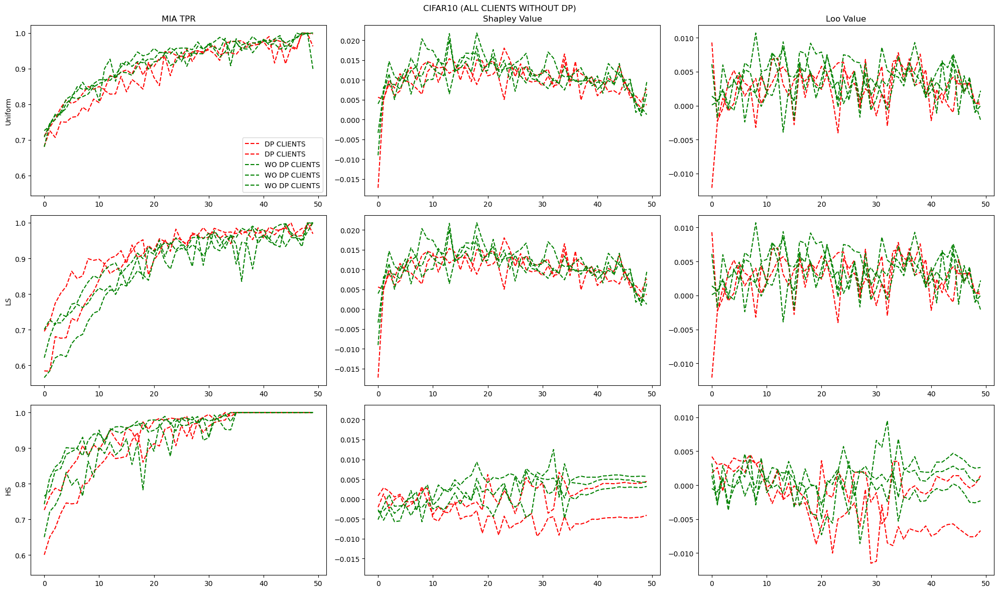

In [25]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'], 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

axes[1][0].sharey(axes[0][0])
axes[2][0].sharey(axes[0][0])
axes[1][1].sharey(axes[0][1])
axes[2][1].sharey(axes[0][1])
axes[1][2].sharey(axes[0][2])
axes[2][2].sharey(axes[0][2])

fig.suptitle("CIFAR10 (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

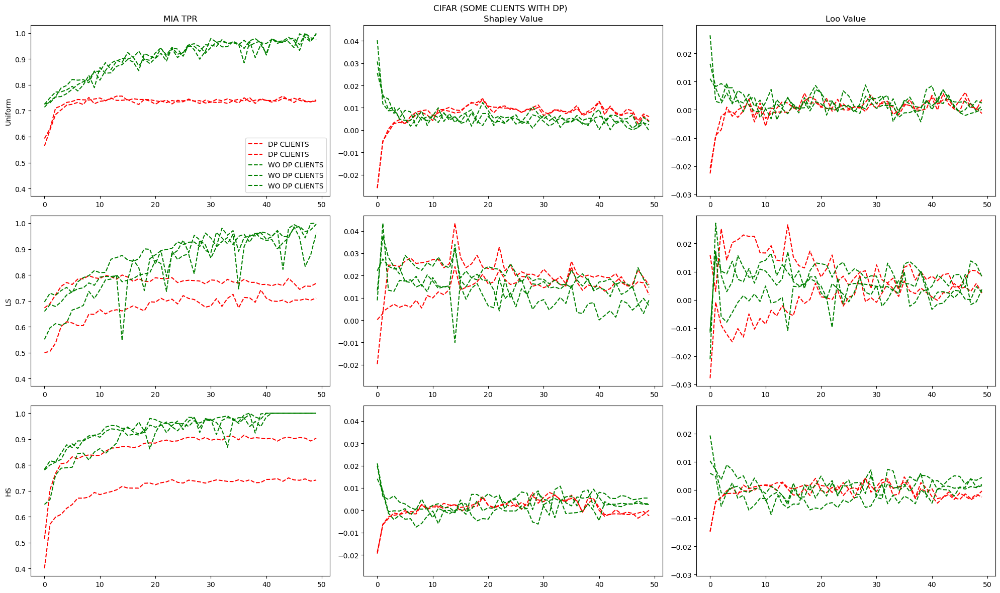

In [26]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'], 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

axes[1][0].sharey(axes[0][0])
axes[2][0].sharey(axes[0][0])
axes[1][1].sharey(axes[0][1])
axes[2][1].sharey(axes[0][1])
axes[1][2].sharey(axes[0][2])
axes[2][2].sharey(axes[0][2])

fig.suptitle("CIFAR (SOME CLIENTS WITH DP)")
fig.tight_layout()

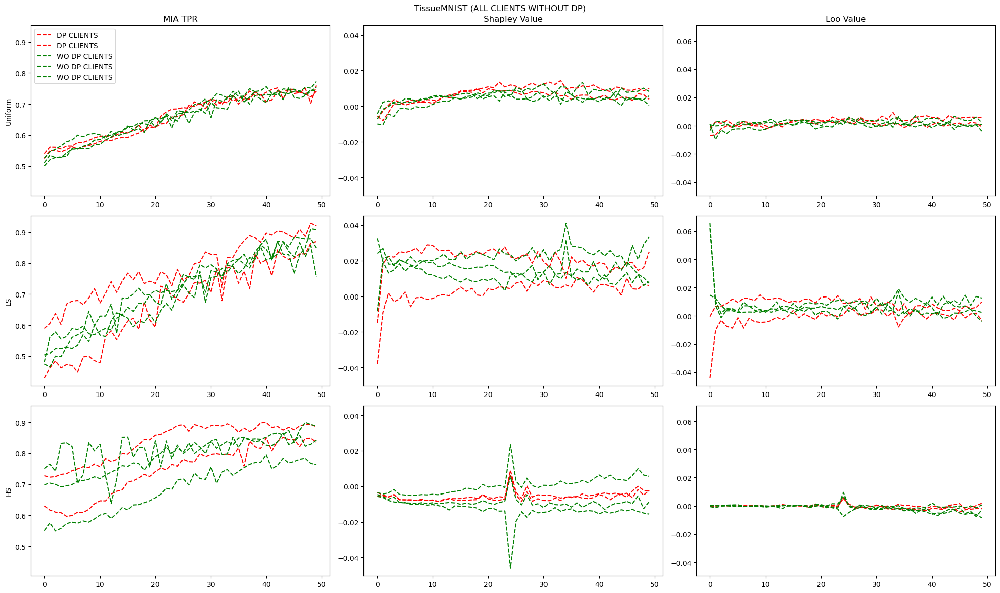

In [27]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

axes[1][0].sharey(axes[0][0])
axes[2][0].sharey(axes[0][0])
axes[1][1].sharey(axes[0][1])
axes[2][1].sharey(axes[0][1])
axes[1][2].sharey(axes[0][2])
axes[2][2].sharey(axes[0][2])

fig.suptitle("TissueMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

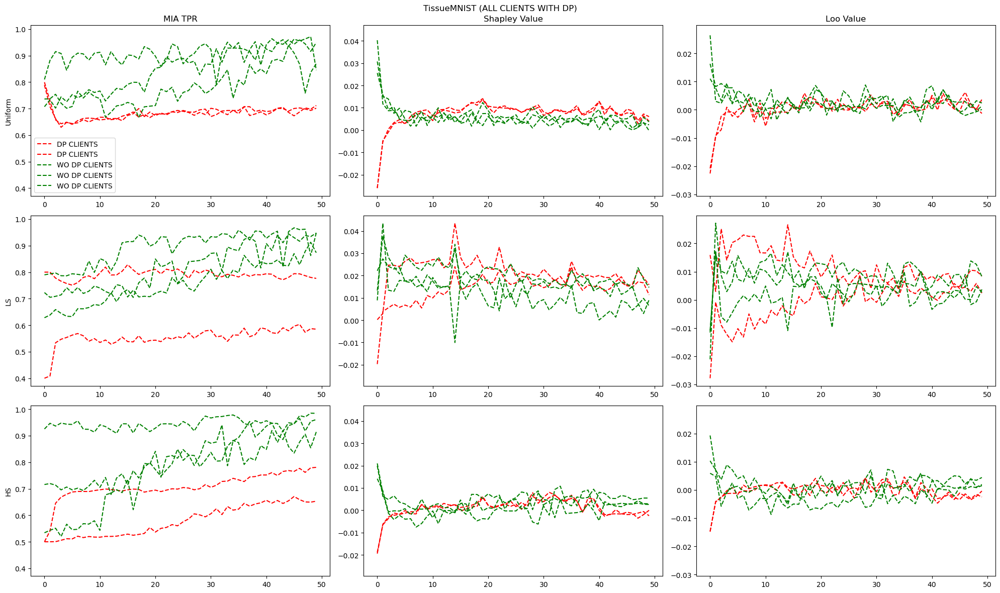

In [28]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

axes[1][0].sharey(axes[0][0])
axes[2][0].sharey(axes[0][0])
axes[1][1].sharey(axes[0][1])
axes[2][1].sharey(axes[0][1])
axes[1][2].sharey(axes[0][2])
axes[2][2].sharey(axes[0][2])

fig.suptitle("TissueMNIST (ALL CLIENTS WITH DP)")
fig.tight_layout()

# Stage I: Visualization of timeline progression (color-coded clients)

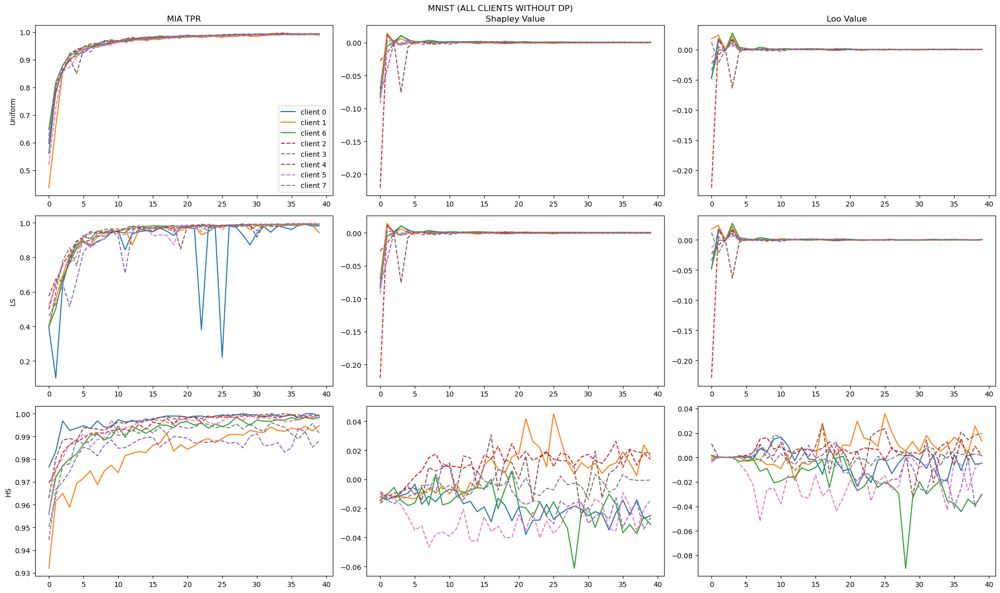

In [29]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("MNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

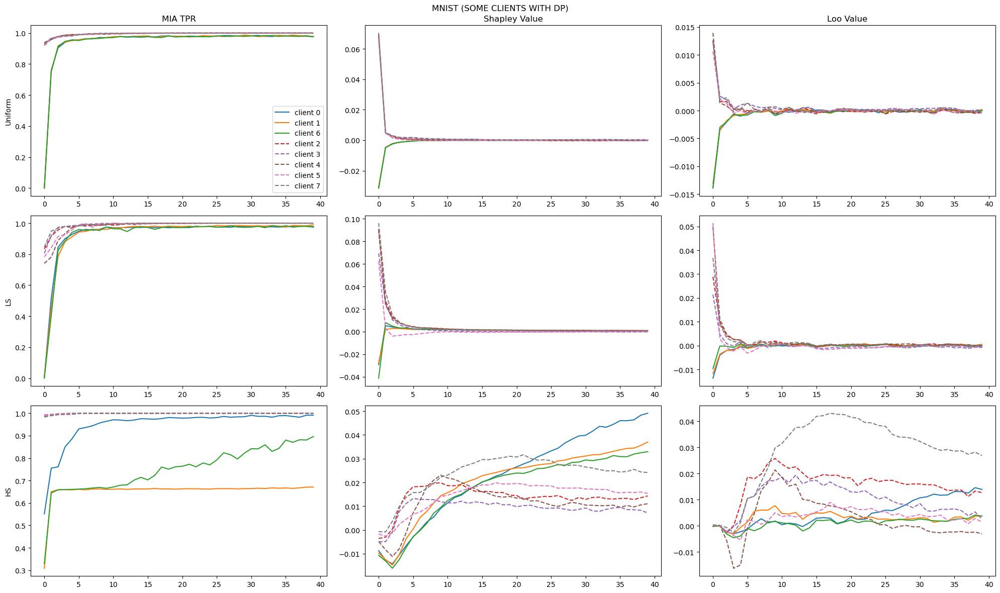

In [30]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("MNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

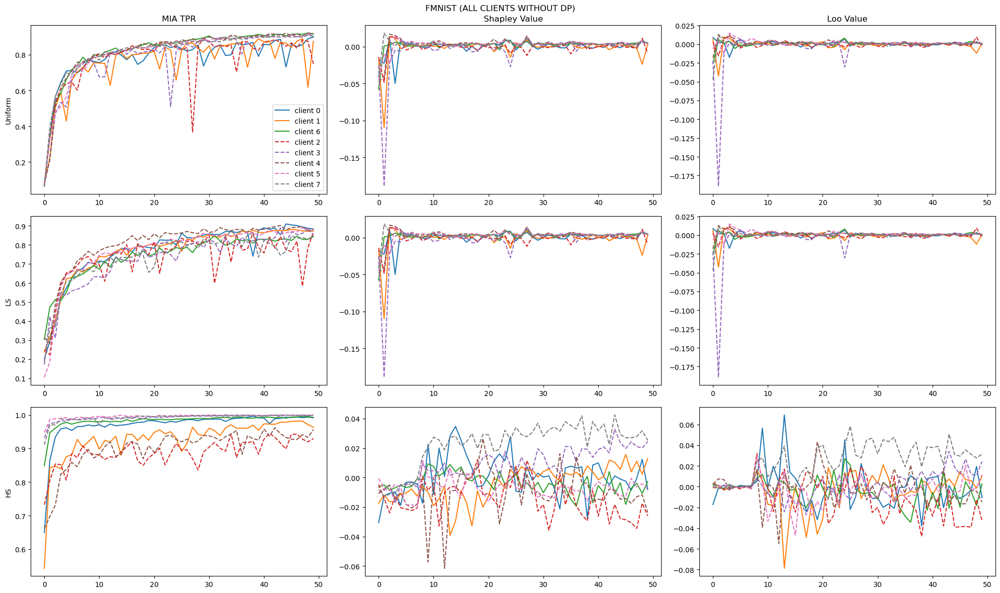

In [31]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("FMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

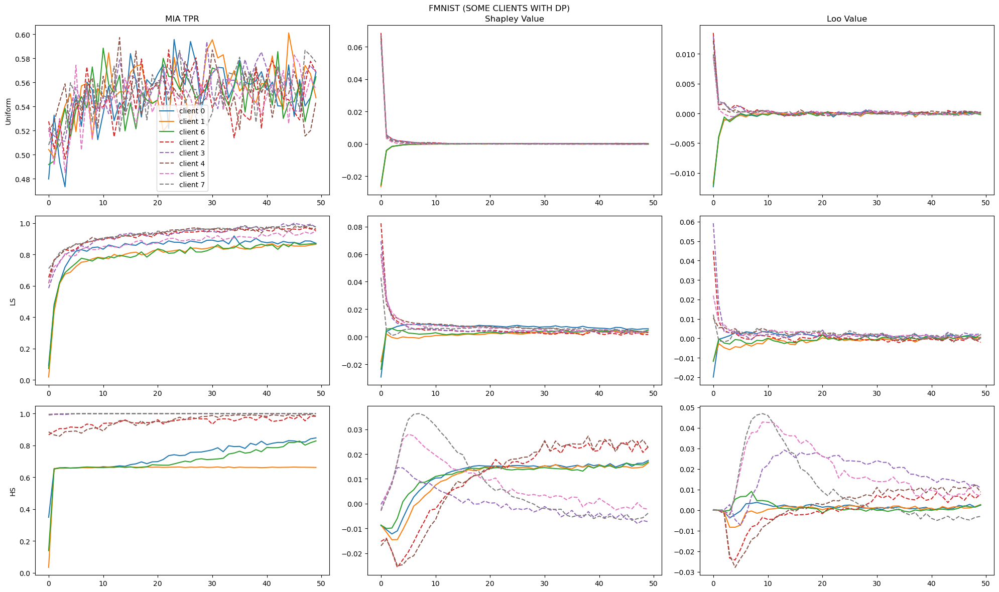

In [32]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("FMNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

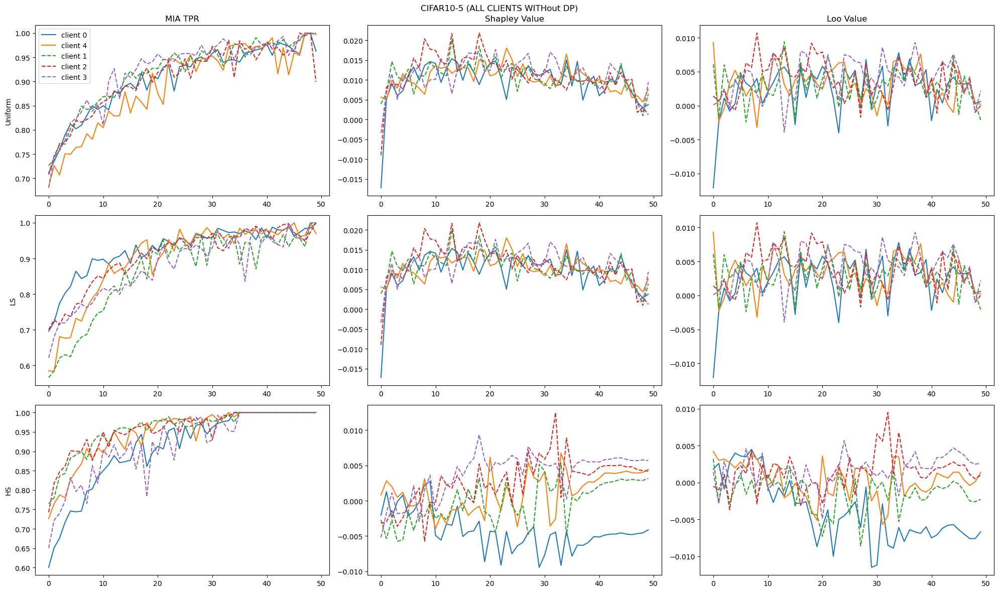

In [33]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("CIFAR10-5 (ALL CLIENTS WITHout DP)")
fig.tight_layout()

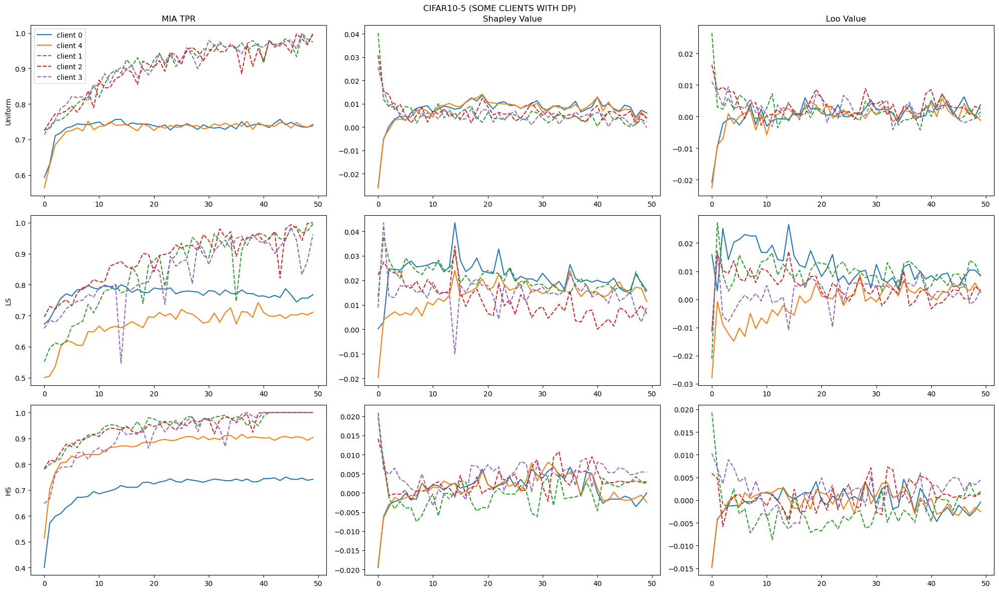

In [34]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("CIFAR10-5 (SOME CLIENTS WITH DP)")
fig.tight_layout()

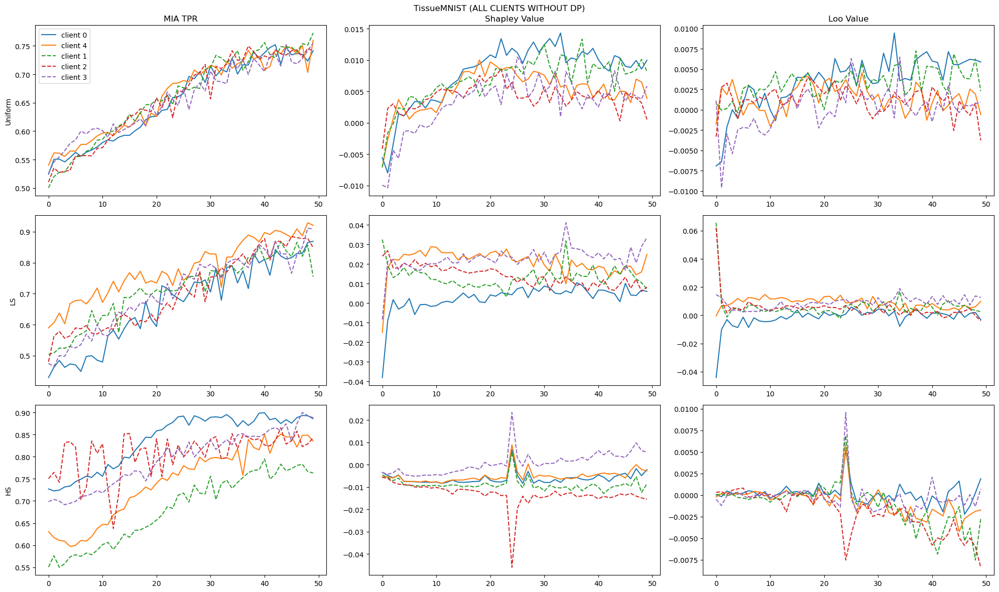

In [35]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("TissueMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

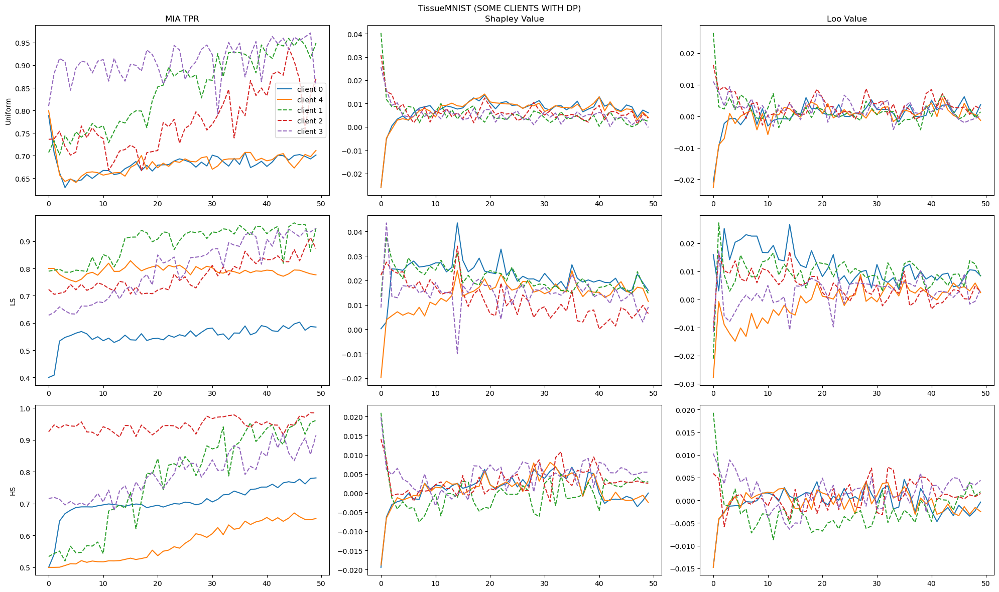

In [36]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("TissueMNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

# Stage III: Visualization of timeline progression (smoothed)

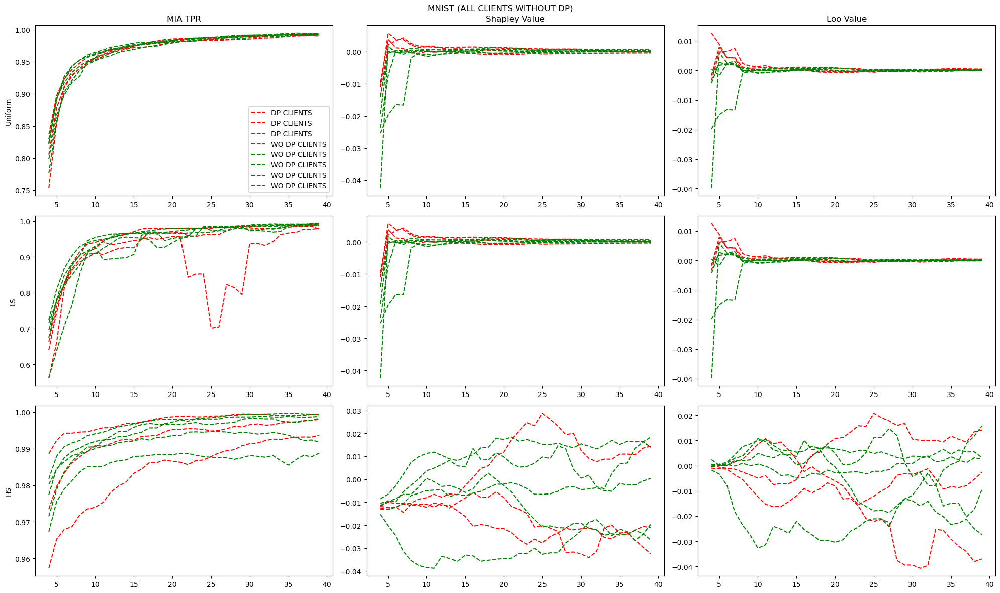

In [37]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'].rolling(5).mean(), 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'].rolling(5).mean(), 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("MNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

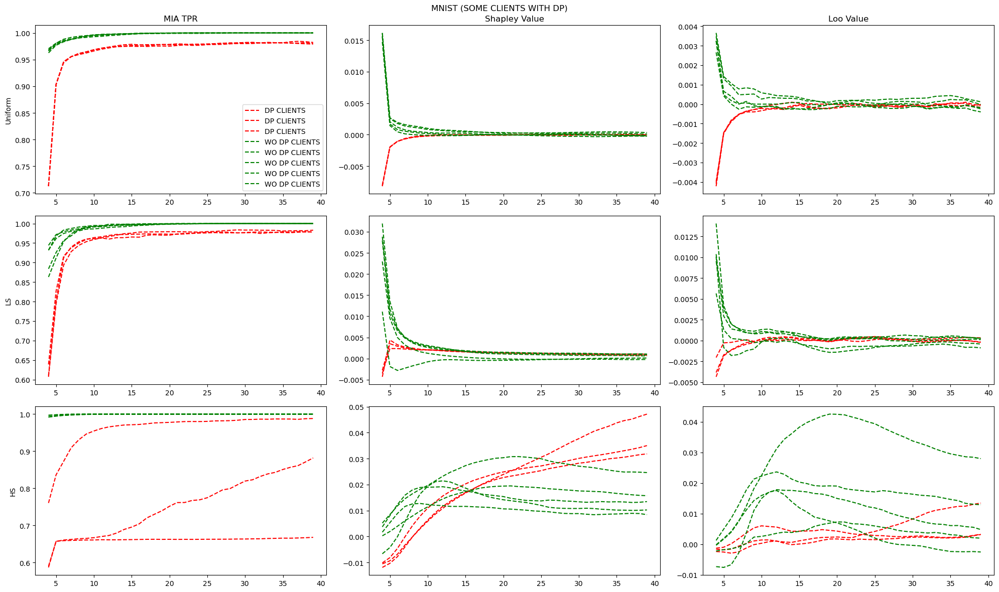

In [38]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'].rolling(5).mean(), 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'].rolling(5).mean(), 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("MNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

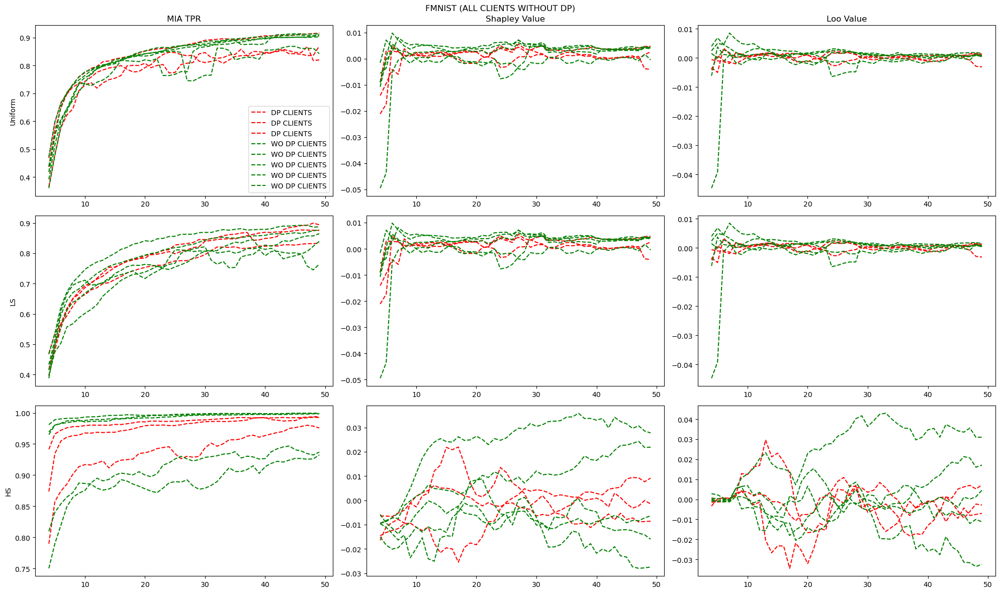

In [39]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'].rolling(5).mean(), 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'].rolling(5).mean(), 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("FMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

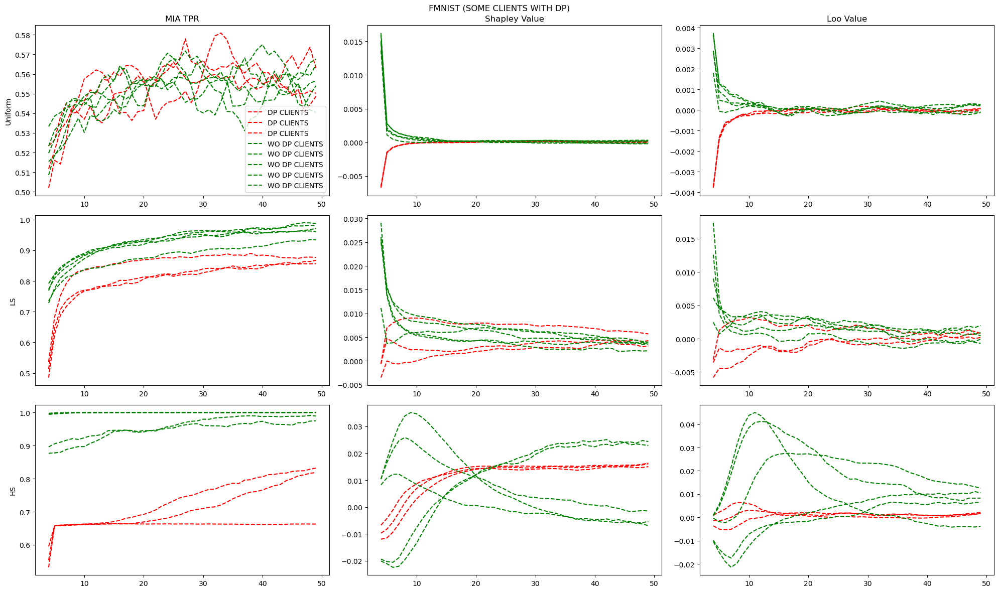

In [40]:


datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'].rolling(5).mean(), 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'].rolling(5).mean(), 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("FMNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()



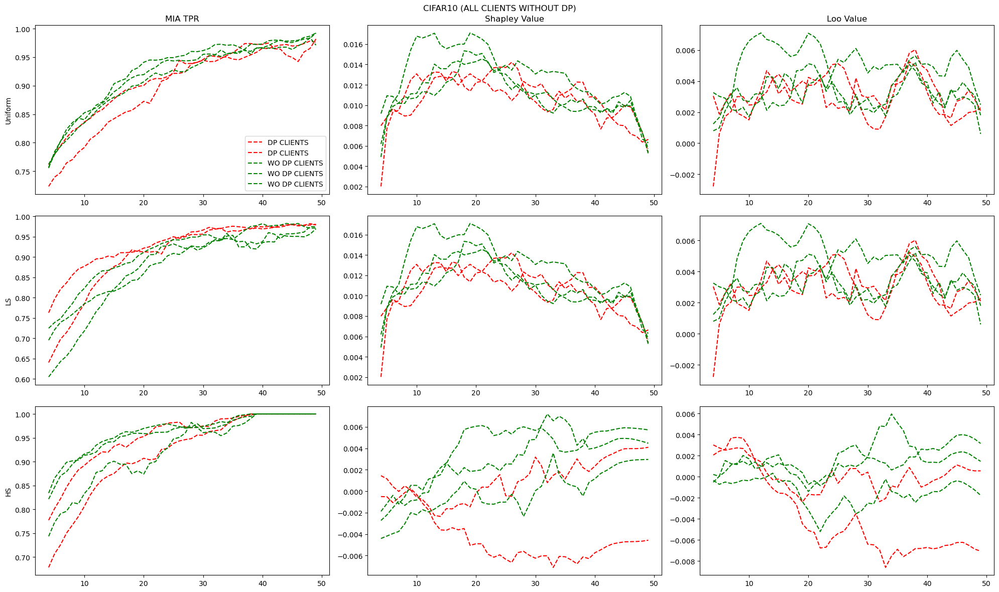

In [41]:


datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'].rolling(5).mean(), 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'].rolling(5).mean(), 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'].rolling(5).mean(), 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'].rolling(5).mean(), 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("CIFAR10 (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()



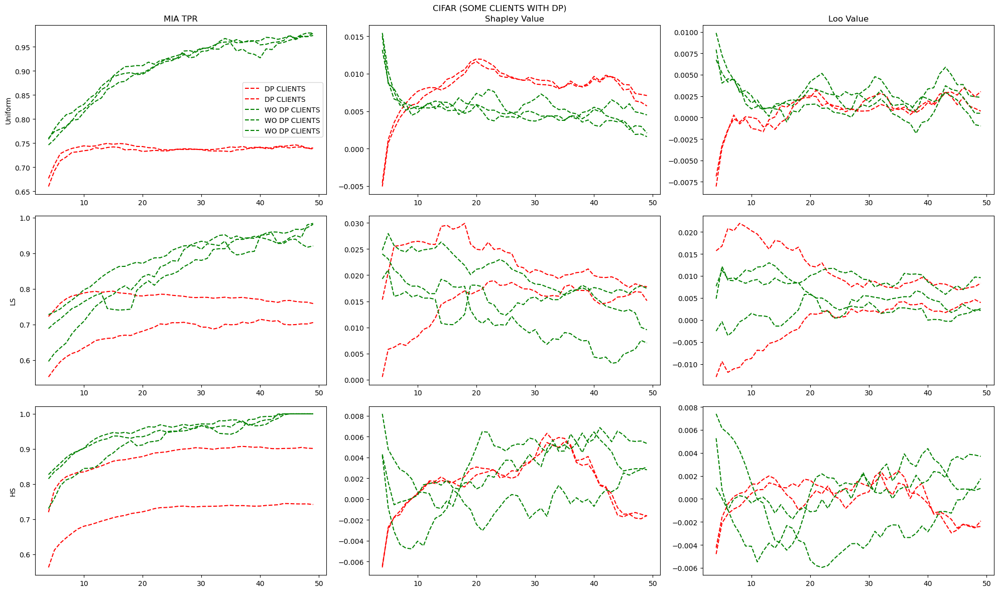

In [42]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'].rolling(5).mean(), 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'].rolling(5).mean(), 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'].rolling(5).mean(), 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'].rolling(5).mean(), 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("CIFAR (SOME CLIENTS WITH DP)")
fig.tight_layout()

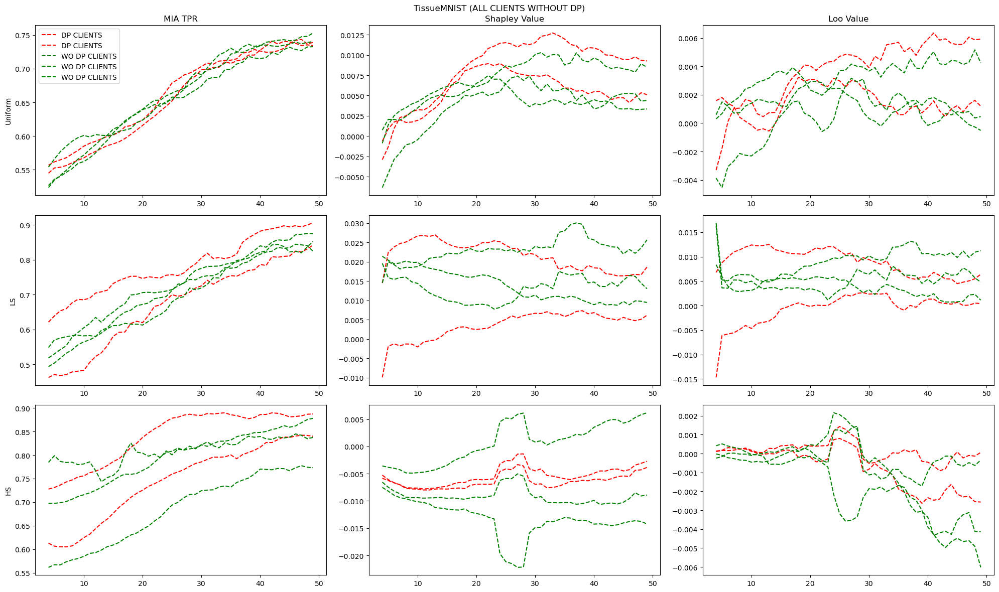

In [43]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'].rolling(5).mean(), 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'].rolling(5).mean(), 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("TissueMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

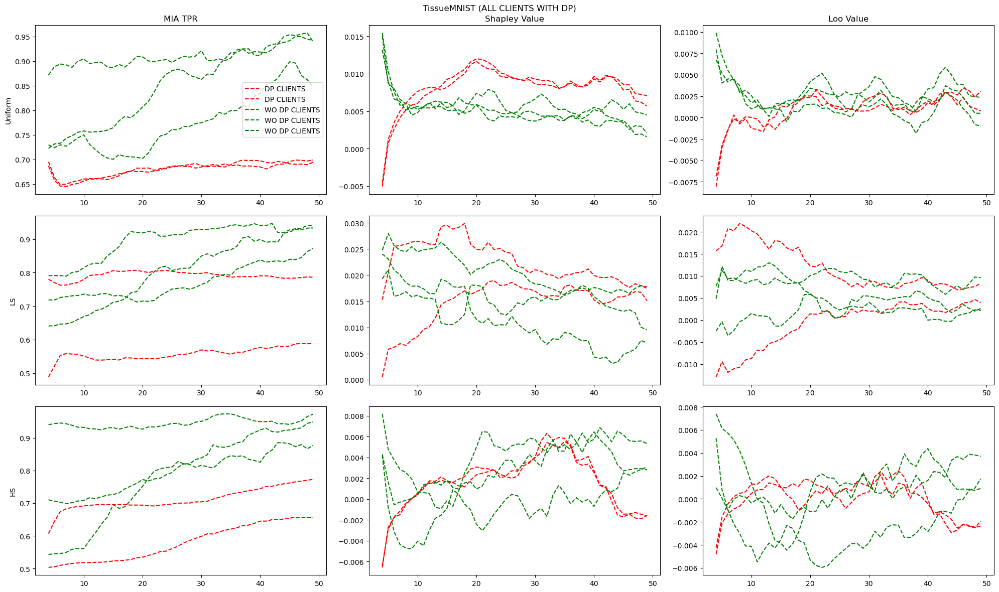

In [ ]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'].rolling(5).mean(), 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'].rolling(5).mean(), 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'].rolling(5).mean(), 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'].rolling(5).mean(), 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("TissueMNIST (ALL CLIENTS WITH DP)")
fig.tight_layout()



# My Observations based on Stages I-III:
- There is no visible correlation between SV and MIA's TPR in the scenario where all clients are clear of any DP mechanism -> so where the only difference in local model's impact on the global model's performance is coming either from data split, model initialization, convergence to different minimas etc. It would be very difficult to use those values as a tool for enhancing the MIA attack.
- There is some mild correlation between SV and TPR in the second case - where some clients are using a DP mechanism. However, it is contrained to:
    a) Only a few first rounds -> in the long run, the DP clients seem to act as a regularizer and even receive positive SV's.
    b) The split of the dataset against which the SV are evaluated must at least resemble the local distribution. If that is not the case, the observations breaks apart and there is no visible pattern.

# Stage IV: Check if the time series are stationary. Augmented Dickey-Fuller (ADF) Test
- H0 (Null Hypothesis): The time series is non-stationary (i.e., it has a unit root).
- H1 (Alternative Hypothesis): The time series is stationary (i.e., it does not have a unit root).
- Fix p-value < 0.05 to rejext H0.

c:\Users\macie\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
c:\Users\macie\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
c:\Users\macie\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
c:\Users\macie\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
c:\Users\macie\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr /

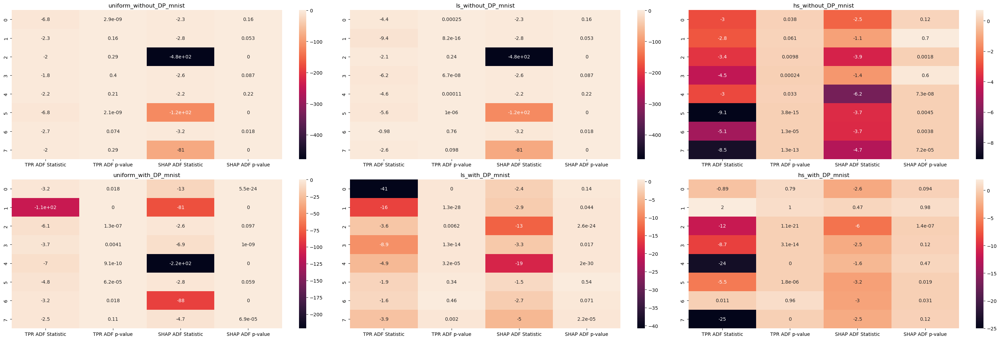

In [71]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_stationarity(
    results=results_wo_DP,
    no_clients=8
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_stationarity(
    results=results_w_DP,
    no_clients=8
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

c:\Users\macie\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
c:\Users\macie\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


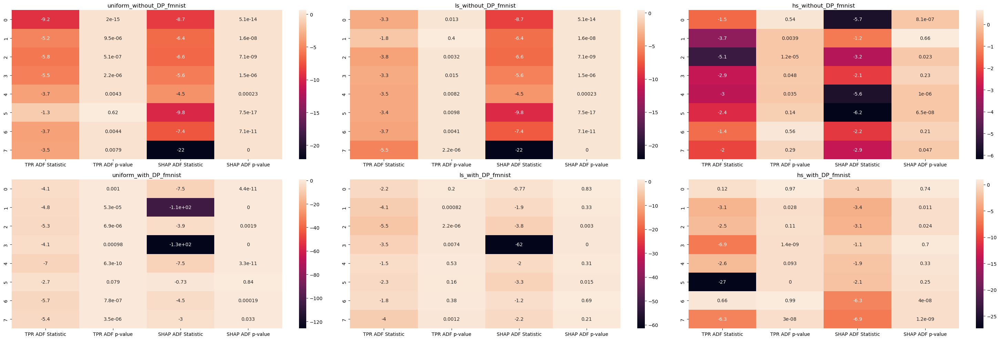

In [72]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_stationarity(
    results=results_wo_DP,
    no_clients=8
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_stationarity(
    results=results_w_DP,
    no_clients=8
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

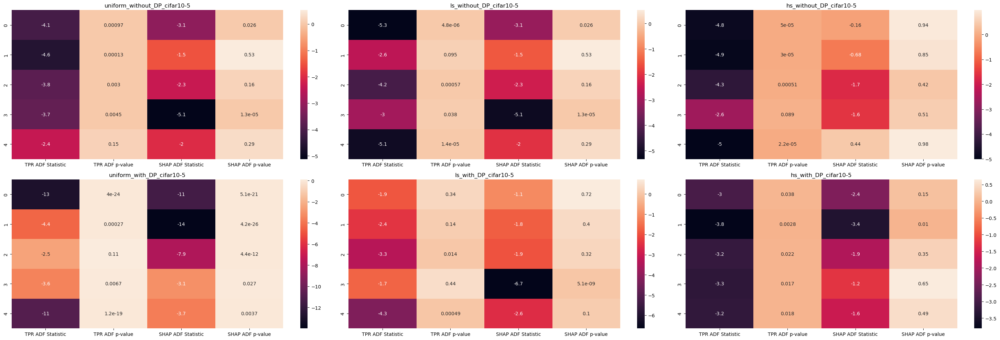

In [74]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_stationarity(
    results=results_wo_DP,
    no_clients=5
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_stationarity(
    results=results_w_DP,
    no_clients=5
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

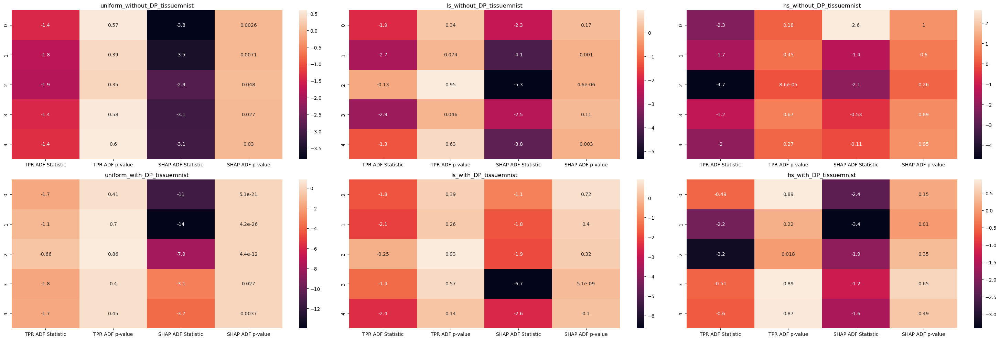

In [75]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_stationarity(
    results=results_wo_DP,
    no_clients=5
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_stationarity(
    results=results_w_DP,
    no_clients=5
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

# My Observations based on Stage IV:
- According to the Augmented Dickey-Fuller (ADF) we failed to reject the null hypothesis for the majority of the clients, as there are many cases for which p-value > 0.05. This implies that time series are non-stationary in their nature -> they are either characterized by a non-constant mean (a visible trend) a non-constant variance (heteroscedasticity) or a non-constant autocorrelation (dependency on past values remains stable). This agrees with an intuitve undestanding of what TPR and SHAP F1 score really represent in our use-case.
- The lack of stationarity implies that we can not apply some tests used to asses the correlationship between two time series, i.e. granger causality. However, we can use Cross-Correlation, Transfer Entropy, Mutual Information and Forecasting Comparison.
- Methods of Transfer Entropy and Mutual Information relies on the accurate probability estimation, which may be unstable with small datasets.

# Stage V: Spearman Correlation
- H0 (Null Hypothesis): There is no monotonic relationship between the two variables.
- H1 (Alternative Hypothesis): There is a monotonic relationship between the two variables (either one-tailed or two-tailed test.)
- Fix p-value < 0.05 to rejext H0.

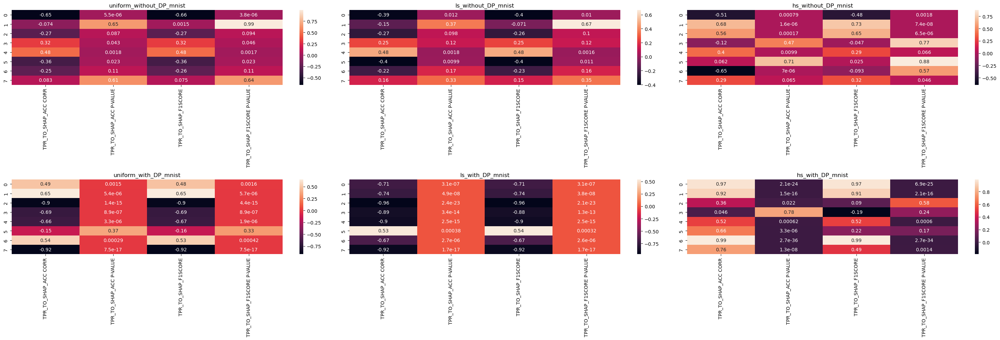

In [88]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_corr_short(
    results=results_wo_DP,
    no_clients=8,
    mode='spearman'
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_corr_short(
    results=results_w_DP,
    no_clients=8,
    mode='spearman'
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

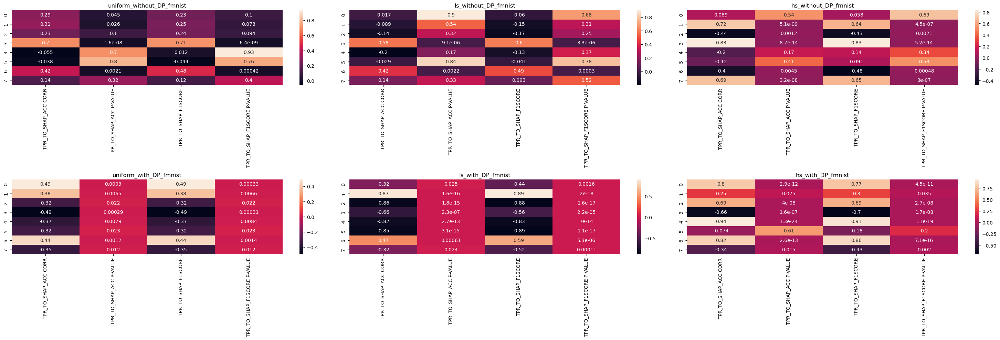

In [89]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_corr_short(
    results=results_wo_DP,
    no_clients=8,
    mode='spearman'
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_corr_short(
    results=results_w_DP,
    no_clients=8,
    mode='spearman'
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

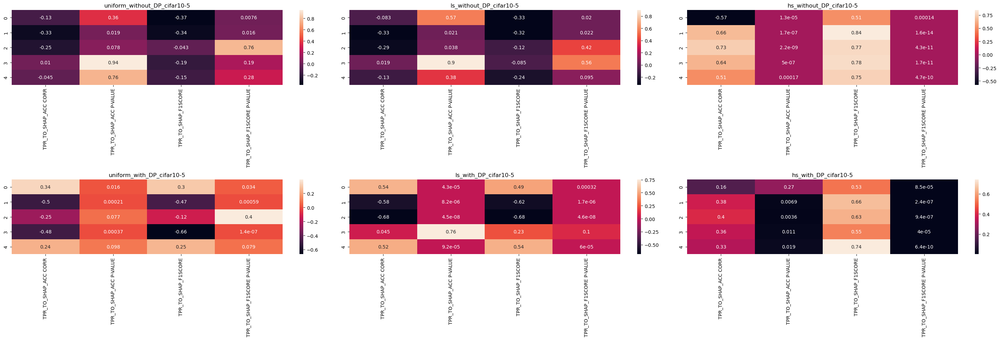

In [90]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_corr_short(
    results=results_wo_DP,
    no_clients=5,
    mode='spearman'
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_corr_short(
    results=results_w_DP,
    no_clients=5,
    mode='spearman'
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

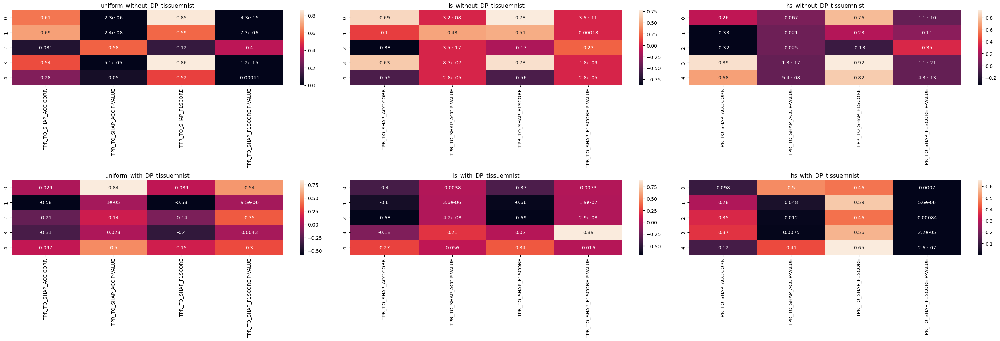

In [91]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_corr_short(
    results=results_wo_DP,
    no_clients=5,
    mode='spearman'
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_corr_short(
    results=results_w_DP,
    no_clients=5,
    mode='spearman'
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

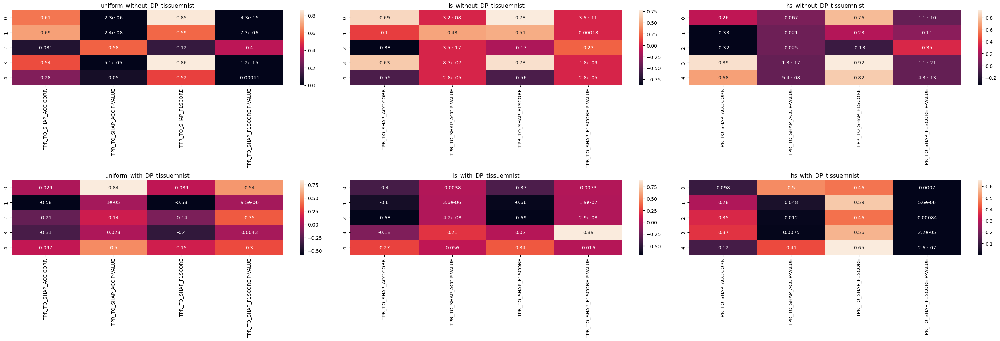

In [92]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_corr_short(
    results=results_wo_DP,
    no_clients=5,
    mode='spearman'
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_corr_short(
    results=results_w_DP,
    no_clients=5,
    mode='spearman'
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

# Stage VI: Pearson Correlation
- H0 (Null Hypothesis): There is no monotonic relationship between the two variables.
- H1 (Alternative Hypothesis): There is a monotonic relationship between the two variables (either one-tailed or two-tailed test.)
- Fix p-value < 0.05 to rejext H0.

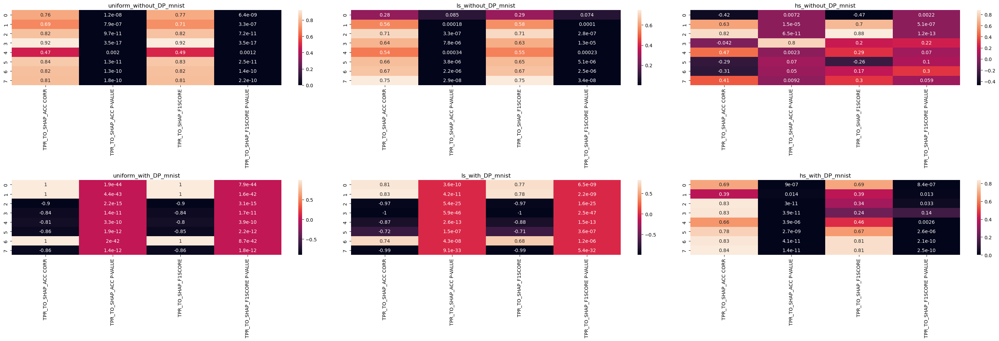

In [93]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_corr_short(
    results=results_wo_DP,
    no_clients=8,
    mode='pearson'
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_corr_short(
    results=results_w_DP,
    no_clients=8,
    mode='pearson'
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

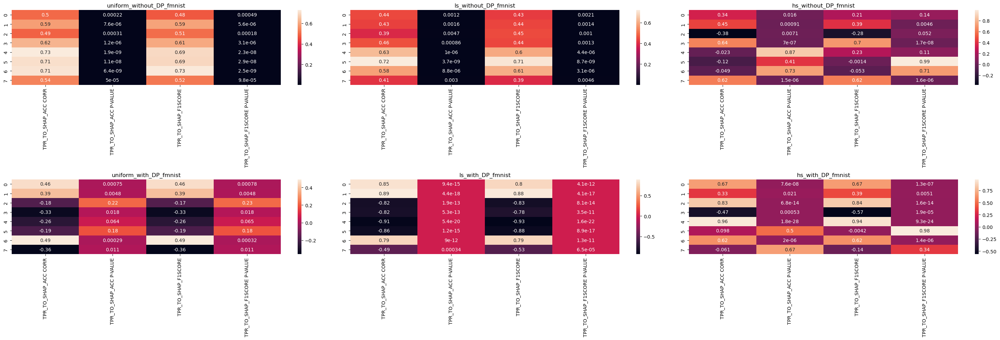

In [94]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_corr_short(
    results=results_wo_DP,
    no_clients=8,
    mode='pearson'
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_corr_short(
    results=results_w_DP,
    no_clients=8,
    mode='pearson'
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

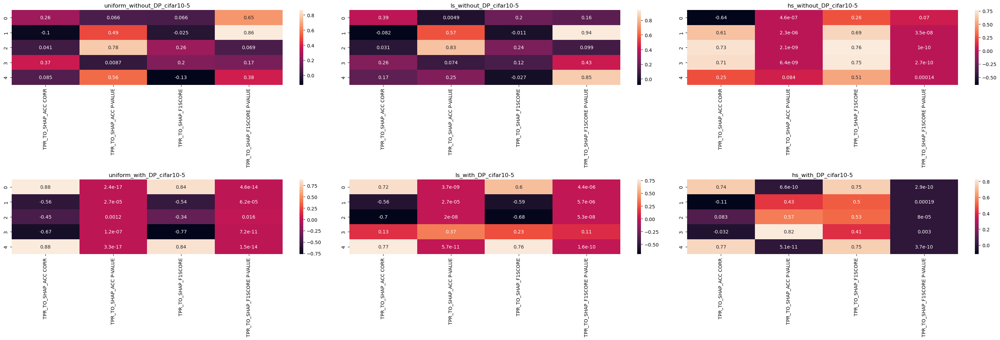

In [95]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_corr_short(
    results=results_wo_DP,
    no_clients=5,
    mode='pearson'
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_corr_short(
    results=results_w_DP,
    no_clients=5,
    mode='pearson'
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

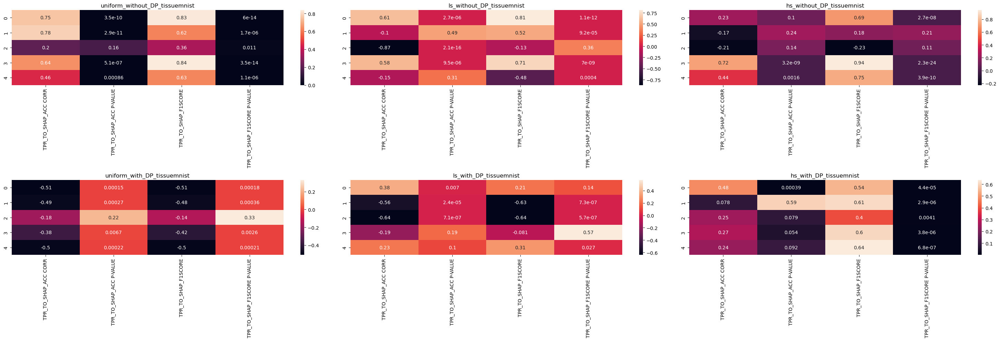

In [96]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 10))

versions = ['without_DP']
results_wo_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_wo_DP = calculate_multiple_corr_short(
    results=results_wo_DP,
    no_clients=5,
    mode='pearson'
    )
for (key, item), ax in zip(corr_wo_DP.items(), axes[0,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)

versions = ['with_DP']
results_w_DP = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)
corr_w_DP = calculate_multiple_corr_short(
    results=results_w_DP,
    no_clients=5,
    mode='pearson'
    )
for (key, item), ax in zip(corr_w_DP.items(), axes[1,:]):
    sns.heatmap(item, ax=ax, annot=True)
    ax.set_title(key)
    
fig.tight_layout()

# My observations based on Stages V to VI:
- We certainly failed to reject the null hypothesis (that there is no monotonic relationship between the MIA's TPR and SHAP based on F1 Score) in the case of the no-DP version.
- We also failed to reject the null hypothesis in the case of a DP-version. Altough as evidenced by the visualizations placed at the beginning of this notebook, there are some visible patterns, to reject the hypothesis even regarding a one split-type within the area of one dataset, we would have to notice the p-value below 0.05 for all the clients included in the simulation. This happened only in the case of CIFAR10 (Uniform split) and MNIST, while in the case of MNIST it can be explained that the monotonicity simply is as a result of a non-existing change in the both TPR and Shapley values from the very few rounds of the training.

# Stage VII: Cross-correlation between MIA TPR and SHAP F1-Score.

In [ ]:
# TODO

# Stage VIII: Forecasting Comparison between MIA TPR and SHAP F1-Score

In [ ]:
# TODO

# My final observations:
- Fromm all the available time series, we have selected True Positive Rate (TPR) as a index for measuring the performance of the MIA and F1Score for the value function of the Shapley Value. We believe that those two are the most reflective of the quantitites that we want to measure.
- Upon the visual inspection, there are some lightly visibly trends between those two time series, but they occur only if those two criterions are met at the same time:
    a) the dataset of the orchestrator (attacker) against which the SV are calcuated is reflective of the local distribution on which the model was trained, and;
    b) the SV are registered only in the first few rounds of the training, when the model's performance is low. However, in those rounds the MIA's TPR are also not very reliable (due to the model's low performance).
- Both time series are non-stationary according to the ADF -> they are either characterized by a non-constant mean (a visible trend) a non-constant variance (heteroscedasticity) or a non-constant autocorrelation (dependency on past values remains stable). It complicates the analysis. Moreover, in case of the SV based on a F1score, it decreases the certainty under which the attacker (the orchestrator) can operate on those values.
- Using more formal tests (Spearman and Pearson correlation) we failed to reject the null hypothesis that there is no clear correlation between MIA's TPR and SV based on F1Score. This further formalized the observation made in the previous sections - that visual inspection deliver some very limited evidence that there are some visible patterns, but their unsystematic nature makes it impossible to rely on them as a tool for pre-selecting the clients.
- One final observation concerns the interesting behaviour of the SV for the DP clients. At the beginning of the training, their values tend to be negative. However, as the training continues, their marginal contribution values are increasing and sometimes even are higer than the original clients.